In [675]:
# Clear all variables
%reset -f

In [676]:
from s04utils.modules.load import timestamps
from s04utils.modules.analyze import levels, preprocessing
from bokeh.plotting import figure, show, output_notebook, curdoc
from IPython.core.display import set_matplotlib_formats
from bokeh.models import LinearAxis, Range1d
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal
from scipy.optimize import curve_fit
from bokeh.models import HoverTool
import seaborn as sns
from skimage.filters import threshold_otsu, threshold_mean
import math
from sklearn.mixture import GaussianMixture
from scipy import stats

In [677]:
# Set the path to the data

# 'step-like' shape
timestamps_path_01 = '/Users/kappel/Messungen/Setup04/JaKa/post_hack/23_08_29/77K-33nM-eGFP-vitrified/05uW/timestamps/tt_eGFP_33nM_NaP_100mM_ph7dot5_Treh7dot5_05uW_77K_circpol_018.h5'

# 'burst-like' shape
timestamps_path_02 = '/Users/kappel/Messungen/Setup04/JaKa/post_hack/23_08_29/77K-33nM-eGFP-vitrified/05uW/timestamps/tt_eGFP_33nM_NaP_100mM_ph7dot5_Treh7dot5_05uW_77K_circpol_019.h5'

In [678]:
# Load timestamps from file

# Timestamps file 01
ts_01 = timestamps.load_from_path(path=timestamps_path_01)

# Timestamps file 02
ts_02 = timestamps.load_from_path(path=timestamps_path_02)



In [679]:
# Set output style for plt plots
#plt.style.use('dark_background')
#plt.style.use('fivethirtyeight')
#plt.style.use('ggplot')
#plt.style.use('seaborn-v0_8')
#plt.style.use('white-grid')

# Set quality for plt plots
set_matplotlib_formats('retina')

# Set output style for bokeh plots
#curdoc().theme = 'dark_minimal'
output_notebook()

/var/folders/2h/6xcys3mx1s7czfj28g_dc70r0000gn/T/ipykernel_66970/1772914816.py:9: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


Loading BokehJS ...

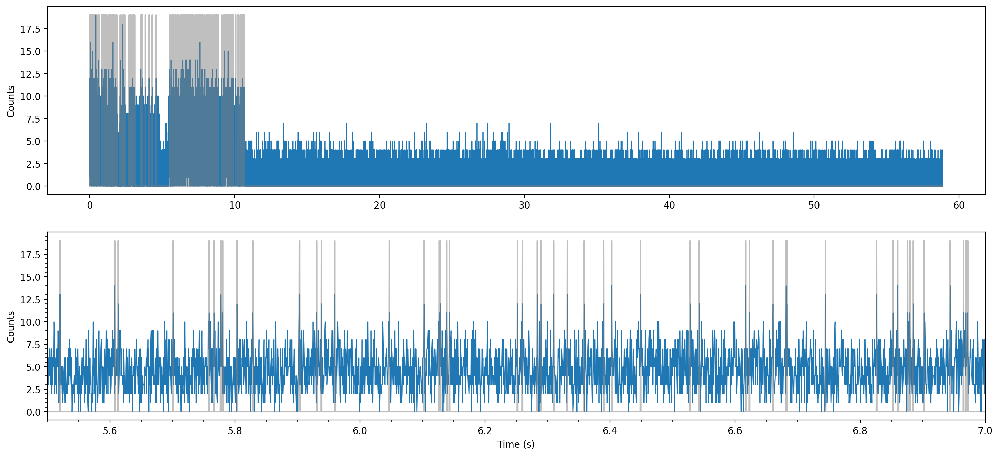

[ 8  8 11 ...  0  1  1]


In [680]:
# Set bin time to 1 ms
bin_time = 0.0005

# Create binned timetrace
timetrace01 = ts_01.get_timetrace_data(bin_width=bin_time)

# Get the binned timetrace data for each individual detector
detector0 = timetrace01['detector0'][0]
detector1 = timetrace01['detector1'][0]

# Perform thresholding on the timetrace of detector 0
threshold = 10
thresh_detector0 = [np.max(detector0) if x > threshold else 0 for x in detector0]

# Create figure with two subplots
fig, ax =   plt.subplots(2, 1, figsize=(18,8))
# Add minor ticks
plt.minorticks_on()

# Create values for x-axis
x = np.arange(0, len(detector0))

# First subplot
y0 = ts_01.get_timetrace_data(bin_width=bin_time)['detector0'][0]
line1 = ax[0].plot(x*bin_time, y0)
ax[0].plot(x*bin_time, thresh_detector0, alpha=0.5, color='gray')

# Second subplot
y1 = ts_01.get_timetrace_data(bin_width=bin_time)['detector0'][0]
line2 = ax[1].plot(x*bin_time, y1)
ax[1].plot(x*bin_time, thresh_detector0, alpha=0.5, color='gray')

# Use polyfit to fit a polynomial to the data
#polyfit = np.polyfit(range(len(detector0)), detector0, 2)

# Plot the polynomial
#plt.plot(np.polyval(polyfit, range(len(detector0))))

# Substract polynomial from data
#detector0_poly = detector0 - np.polyval(polyfit, range(len(detector0)))

# Plot the substraction
#plt.plot(detector0_poly)

# Add axis labels
ax[0].set_ylabel('Counts')
ax[1].set_ylabel('Counts')
ax[1].set_xlabel('Time (s)')

# Set axis limits
ax[1].set_xlim(5.5, 7)

# Set line width
line1[0].set_linewidth(1)
line2[0].set_linewidth(1)

# Show the plot
plt.show()

print(detector0)
# Save detector0 to a text file
np.savetxt('detector0.txt', detector0, fmt='%d')

In [681]:
timestamps0 = detector0
timetrace_len = timestamps0[-1]
timetrace_len_in_s = 5e-9 * timetrace_len
x = np.linspace(0, timetrace_len_in_s, len(detector0))


p = figure(width=1600, height=400, title='steps')

p.line(x, detector0, line_color='#517BA1', line_width=1)
p.line(x, thresh_detector0, line_color='red', alpha=0.2 , line_width=1)

# Fill area under the curve
p.varea(x=x, y1=thresh_detector0, y2=0, fill_color='red', alpha=0.2)

# Plot the threshold as a horizontal line
p.line(x, np.ones(len(x)) * threshold, line_color='green', alpha=0.4 , line_width=2)

# Add a HoverTool to display cursor information
hover = HoverTool(tooltips=[('x', '$x'), ('y', '$y')])
p.add_tools(hover)

# Set the axis labels
p.xaxis.axis_label = 'time (s)'
p.yaxis.axis_label = 'counts per ' + str(int(bin_time*1e3)) + ' ms'

# Show the plot
show(p)

Otsu threshold: 2
Maxima of the component distributions: [3.96953922 0.68986522]
Maximum of the on population: 4


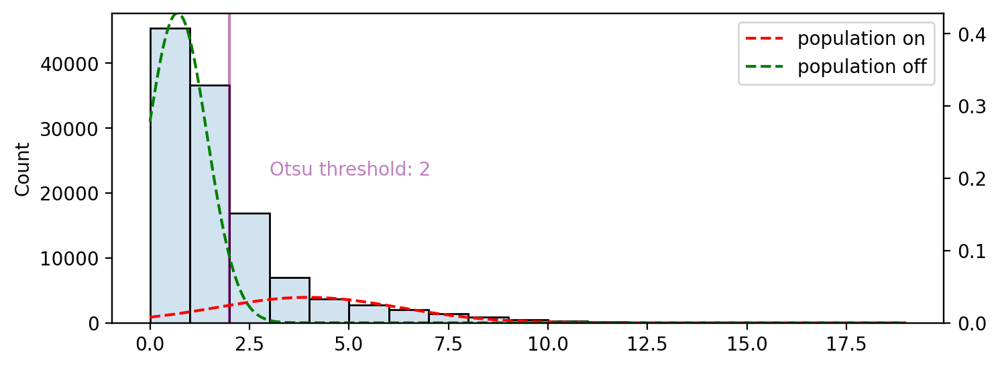

In [682]:
detector0_len = len(detector0)
detector0_half = detector0[:int(detector0_len/2)]

# Create histogram ov values in timetrace
hist, bin_edges = np.histogram(detector0, bins=np.max(detector0))

# Create figure for seaborn histplot
fig, ax1 = plt.subplots(figsize=(8,3))
sns.histplot(detector0, bins=np.max(detector0), ax=ax1, alpha=0.2)

# Calculate Otsu's threshold
threshold_otsu = threshold_otsu(detector0)

# Plot the thresholds as a vertical lines
plt.axvline(threshold_otsu, color='purple', alpha=0.5)

# Plot the values of the thresholds as text
plt.text(threshold_otsu+1, np.max(hist)/2, 'Otsu threshold: ' + str(threshold_otsu), rotation=0, color='purple', alpha=0.5)

print('Otsu threshold: ' + str(threshold_otsu))


# Create a second y-axis on the right side
ax2 = ax1.twinx()

# Fit a mixture model to the histogram
gmm = GaussianMixture(n_components=2)
gmm.fit(detector0.reshape(-1, 1))

# Get the means and standard deviations of the component distributions
means = gmm.means_.flatten()
stds = np.sqrt(gmm.covariances_).flatten()

# Plot the component distributions as normal curves
x = np.linspace(0, np.max(detector0), 1000)
y1 = gmm.weights_[0] * stats.norm.pdf(x, means[0], stds[0])
y2 = gmm.weights_[1] * stats.norm.pdf(x, means[1], stds[1])

ax2.plot(x, y1, 'r--', label='population on')
ax2.plot(x, y2, 'g--', label='population off')
ax2.margins(y=0)

# Print x values of the maxima of the component distributions
print('Maxima of the component distributions: ' + str(means))
print('Maximum of the on population: ' + str(round(means[0])))

# Pick the higher value as the threshold
if means[0] > means[1]:
    threshold_on = round(means[0])
else:
    threshold_on = round(means[1])


# Add max values of the component distributions as vertical lines
#ax2.axvline(means[0], color='red', alpha=0.5)
#ax2.axvline(means[1], color='green', alpha=0.5)

plt.legend()
plt.show()



In [683]:
def hyst(x, th_lo, th_hi, initial = False):
    hi = x > th_hi
    lo_or_hi = (x < th_lo) | hi
    ind = np.nonzero(lo_or_hi)[0]
    if not ind.size: # prevent index error if ind is empty
        return np.zeros_like(x, dtype=bool) | initial
    cnt = np.cumsum(lo_or_hi) # from 0 to len(ind)
    return np.where(cnt, hi[ind[cnt-1]], initial)

timestamps0 = ts_01.data['detector0'].to_numpy()
timetrace_len = timestamps0[-1]
timetrace_len_in_s = 5e-9 * timetrace_len



steps = timetrace_len_in_s/bin_time
print('Number of steps: ' + str(steps))

# Get digits of bin_time
bin_time_digits = len(str(bin_time).split('.')[1])

# Round timetrace_len_in_s to same number of digits as bin_time
timetrace_len_in_s = round(timetrace_len_in_s, bin_time_digits) - 2*bin_time

x = np.linspace(0, timetrace_len_in_s, len(detector0))
print('Tiemtrace len in s: ' + str(timetrace_len_in_s) + ' s')

print('Timevalue of last datapoint: ' + str(x[-1]) + ' ms')

print('Difference between two datapoints: '+ str(x[1] - x[0]))
print('Timevalue of first datapoint: ' + str(x[0]) + ' ms')
print('Timevalue of second datapoint: ' + str(x[1]) + ' ms')

print('Total timetrace length: ' + str(timetrace_len_in_s) + ' s')
print('Time trace length with bintime resolution: ' + str(bin_time * len(detector0)) + ' s')
print('Total number of datapoints in counts: ' + str(len(detector0)))
print('Total number of datapoints in bins: ' + str(len(x)))
print('Step size: ' + str((timetrace_len_in_s-2*bin_time) / len(detector0)) + ' s')



# Set the thresholds
th_lo = threshold_otsu
th_hi = threshold_on

# Calculate hysteresis
hyst_detector0 = hyst(detector0, th_lo=th_lo, th_hi=th_hi, initial=True)

# Replace True with 1 and False with 0
hyst_detector0 = hyst_detector0.astype(int)

p = figure(width=1600, height=400, title='steps')

# Setting the second y axis range name and range
p.extra_y_ranges = {"on_off": Range1d(start=0, end=1)}
p.y_range = Range1d(0, np.max(detector0)+10)
#p.extra_y_ranges["on_off"] = Range1d(start=0, end=1)

# Adding the second axis to the plot.  
p.add_layout(LinearAxis(y_range_name="on_off"), 'right')

signal = p.line(x, detector0, line_color='#517BA1', line_width=1)
#p.line(x, hyst_detector0, line_color='red', alpha=0.2 , line_width=1, y_range_name="on_off")
p.varea(x=x, y1=hyst_detector0, y2=0, fill_color='red', alpha=0.2, y_range_name="on_off")

# Fill area under the curve
#p.varea(x=x, y1=thresh_detector0, y2=0, fill_color='red', alpha=0.2)

# Plot the thresholds as a horizontal lines
p.line(x, np.ones(len(x)) * th_hi, line_color='green', alpha=0.4 , line_width=2)
p.line(x, np.ones(len(x)) * th_lo, line_color='red', alpha=0.4 , line_width=2)

# Add a HoverTool to display cursor information
hover = HoverTool(tooltips=[('x', '$x'), ('y', '$y')], mode='mouse', point_policy='snap_to_data', renderers=[signal])
p.add_tools(hover)
p.margin = 0

# Set the axis labels
p.xaxis.axis_label = 'time (s)'
p.yaxis.axis_label = 'counts per ' + str(int(bin_time*1e3)) + ' ms'

# Show the plot
show(p)

# Print a preview of x in a nice way
def pprint(x):
    print('[' + ', '.join(['{:.6f}'.format(i) for i in x]) + ']')
pprint(x)

Number of steps: 117704.9835
Tiemtrace len in s: 58.8515 s
Timevalue of last datapoint: 58.8515 ms
Difference between two datapoints: 0.0005
Timevalue of first datapoint: 0.0 ms
Timevalue of second datapoint: 0.0005 ms
Total timetrace length: 58.8515 s
Time trace length with bintime resolution: 58.852000000000004 s
Total number of datapoints in counts: 117704
Total number of datapoints in bins: 117704
Step size: 0.0004999872561680147 s


[0.000000, 0.000500, 0.001000, 0.001500, 0.002000, 0.002500, 0.003000, 0.003500, 0.004000, 0.004500, 0.005000, 0.005500, 0.006000, 0.006500, 0.007000, 0.007500, 0.008000, 0.008500, 0.009000, 0.009500, 0.010000, 0.010500, 0.011000, 0.011500, 0.012000, 0.012500, 0.013000, 0.013500, 0.014000, 0.014500, 0.015000, 0.015500, 0.016000, 0.016500, 0.017000, 0.017500, 0.018000, 0.018500, 0.019000, 0.019500, 0.020000, 0.020500, 0.021000, 0.021500, 0.022000, 0.022500, 0.023000, 0.023500, 0.024000, 0.024500, 0.025000, 0.025500, 0.026000, 0.026500, 0.027000, 0.027500, 0.028000, 0.028500, 0.029000, 0.029500, 0.030000, 0.030500, 0.031000, 0.031500, 0.032000, 0.032500, 0.033000, 0.033500, 0.034000, 0.034500, 0.035000, 0.035500, 0.036000, 0.036500, 0.037000, 0.037500, 0.038000, 0.038500, 0.039000, 0.039500, 0.040000, 0.040500, 0.041000, 0.041500, 0.042000, 0.042500, 0.043000, 0.043500, 0.044000, 0.044500, 0.045000, 0.045500, 0.046000, 0.046500, 0.047000, 0.047500, 0.048000, 0.048500, 0.049000, 0.049500,

In [684]:
intervals_on = []
start = None

for i, v in enumerate(hyst_detector0):
    if v == 1 and start is None:
        start = i
    elif v == 0 and start is not None:
        intervals_on.append(i - start)
        start = None

if start is not None:
    intervals_on.append(len(hyst_detector0) - start)

print(intervals_on)

[3, 20, 3, 12, 4, 2, 6, 2, 30, 39, 20, 52, 22, 2, 5, 3, 7, 7, 3, 2, 7, 5, 28, 10, 25, 27, 5, 26, 8, 23, 15, 6, 13, 2, 14, 11, 28, 18, 36, 32, 4, 9, 12, 14, 12, 3, 27, 16, 1, 3, 5, 3, 24, 8, 5, 6, 18, 11, 2, 5, 15, 4, 4, 14, 9, 12, 8, 14, 9, 16, 2, 3, 3, 1, 4, 12, 14, 25, 5, 12, 18, 6, 18, 26, 15, 16, 18, 1, 28, 9, 1, 12, 6, 24, 7, 3, 6, 7, 3, 13, 5, 1, 19, 7, 4, 7, 16, 1, 5, 4, 2, 2, 3, 4, 1, 50, 15, 9, 5, 17, 11, 1, 4, 10, 4, 14, 1, 2, 18, 4, 9, 5, 12, 2, 21, 6, 13, 2, 18, 11, 7, 3, 1, 11, 1, 9, 6, 8, 4, 2, 4, 4, 2, 13, 42, 29, 5, 1, 3, 2, 11, 9, 3, 4, 23, 16, 7, 9, 3, 2, 11, 29, 2, 2, 16, 5, 2, 21, 4, 10, 19, 3, 3, 3, 6, 3, 1, 2, 1, 1, 1, 5, 21, 12, 9, 8, 21, 10, 14, 9, 11, 3, 3, 6, 1, 5, 9, 17, 3, 1, 8, 3, 11, 6, 10, 8, 4, 3, 2, 11, 8, 1, 3, 11, 7, 3, 8, 1, 6, 2, 8, 4, 6, 1, 1, 1, 1, 1, 2, 1, 15, 1, 5, 3, 13, 1, 3, 5, 6, 1, 9, 4, 10, 3, 1, 8, 1, 1, 4, 3, 6, 14, 35, 30, 5, 3, 3, 13, 13, 7, 14, 10, 11, 42, 3, 2, 6, 2, 8, 4, 3, 1, 8, 3, 7, 15, 10, 26, 12, 3, 16, 24, 19, 10, 8, 5, 28, 2

In [685]:
intervals_off = []
start = None

for i, v in enumerate(hyst_detector0):
    if v == 0 and start is None:
        start = i
    elif v == 1 and start is not None:
        intervals_off.append(i - start)
        start = None

if start is not None:
    intervals_off.append(len(hyst_detector0) - start)

print(intervals_off)

[2, 1, 6, 5, 1, 1, 2, 1, 2, 2, 3, 3, 2, 3, 3, 1, 1, 1, 1, 5, 5, 2, 1, 1, 3, 1, 5, 1, 2, 3, 1, 3, 3, 1, 2, 1, 1, 3, 1, 1, 3, 1, 2, 9, 2, 1, 1, 1, 3, 3, 1, 2, 2, 2, 3, 1, 1, 2, 1, 1, 3, 1, 4, 3, 2, 1, 4, 4, 1, 2, 1, 2, 1, 1, 5, 1, 4, 3, 1, 4, 3, 3, 2, 2, 1, 3, 1, 1, 1, 1, 1, 1, 1, 4, 1, 5, 2, 1, 1, 2, 2, 1, 3, 1, 3, 3, 1, 2, 3, 2, 2, 2, 1, 2, 2, 1, 1, 1, 3, 2, 1, 1, 1, 2, 3, 2, 4, 3, 1, 1, 2, 3, 1, 1, 2, 1, 3, 2, 4, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 3, 4, 1, 1, 2, 1, 2, 1, 6, 2, 2, 2, 4, 1, 1, 3, 2, 1, 2, 2, 4, 4, 3, 2, 2, 3, 1, 24, 1, 2, 2, 1, 1, 3, 2, 28, 20, 24, 17, 16, 37, 3, 2, 1, 1, 5, 8, 2, 1, 2, 2, 2, 1, 2, 2, 21, 2, 1, 1, 5, 6, 5, 3, 2, 9, 3, 4, 1, 2, 4, 3, 1, 4, 2, 1, 3, 5, 1, 4, 6, 2, 4, 1, 1, 1, 12, 1, 1, 3, 4, 4, 3, 1, 2, 1, 2, 2, 4, 1, 2, 1, 2, 1, 1, 2, 3, 5, 3, 7, 3, 1, 3, 4, 10, 13, 2, 2, 1, 10, 5, 1, 3, 1, 4, 2, 3, 1, 2, 1, 1, 1, 1, 3, 1, 74, 1, 1, 2, 2, 3, 2, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 3, 38, 55, 67, 33, 66, 56, 86, 13, 5, 1, 2, 2, 2, 4, 6, 2, 4, 4, 2, 8, 1, 5, 3, 

Text(0, 0.5, 'counts')

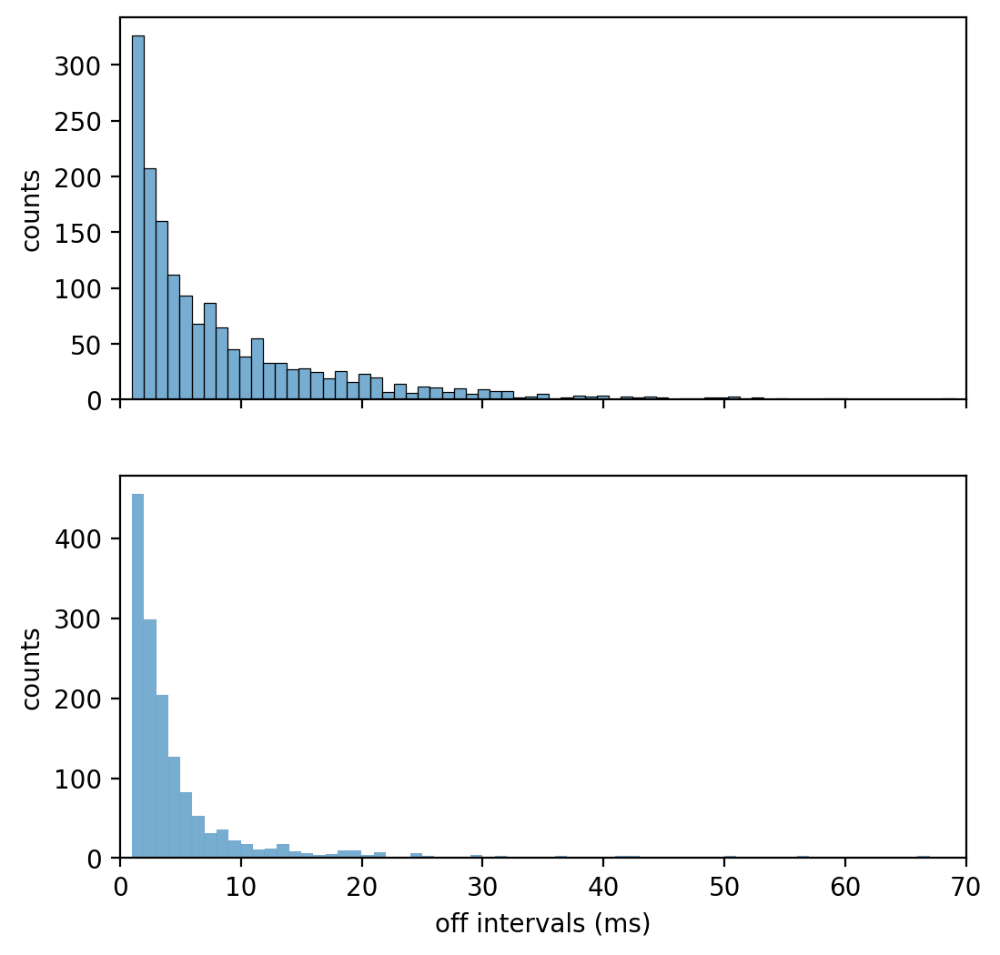

In [686]:
# delete last off time from intervals_off
del intervals_off[-1]

# Create a figure for two subplots 
fig, ax = plt.subplots(2, 1, figsize=(6,6), sharex=True)

# seaborn histplot of the on intervals
sns.histplot(intervals_on, bins=np.max(intervals_on), ax=ax[0], alpha=0.6, log_scale=(False, False))
#ax[0].set_yscale('log')

# Set axis labels
ax[0].set_xlabel('on intervals (ms)')
ax[0].set_ylabel('counts')

# seaborn histplot of the off intervals
sns.histplot(intervals_off, bins=np.max(intervals_off), ax=ax[1], alpha=0.6, log_scale=(False, False))
#ax[1].set_yscale('log')
#ax[1].set_xscale('log')
ax[1].set_xlim(0, 70)

# Set axis labels
ax[1].set_xlabel('off intervals (ms)')
ax[1].set_ylabel('counts')


69
3166
68
11400


ValueError: operands could not be broadcast together with shapes (68,) (69,) 

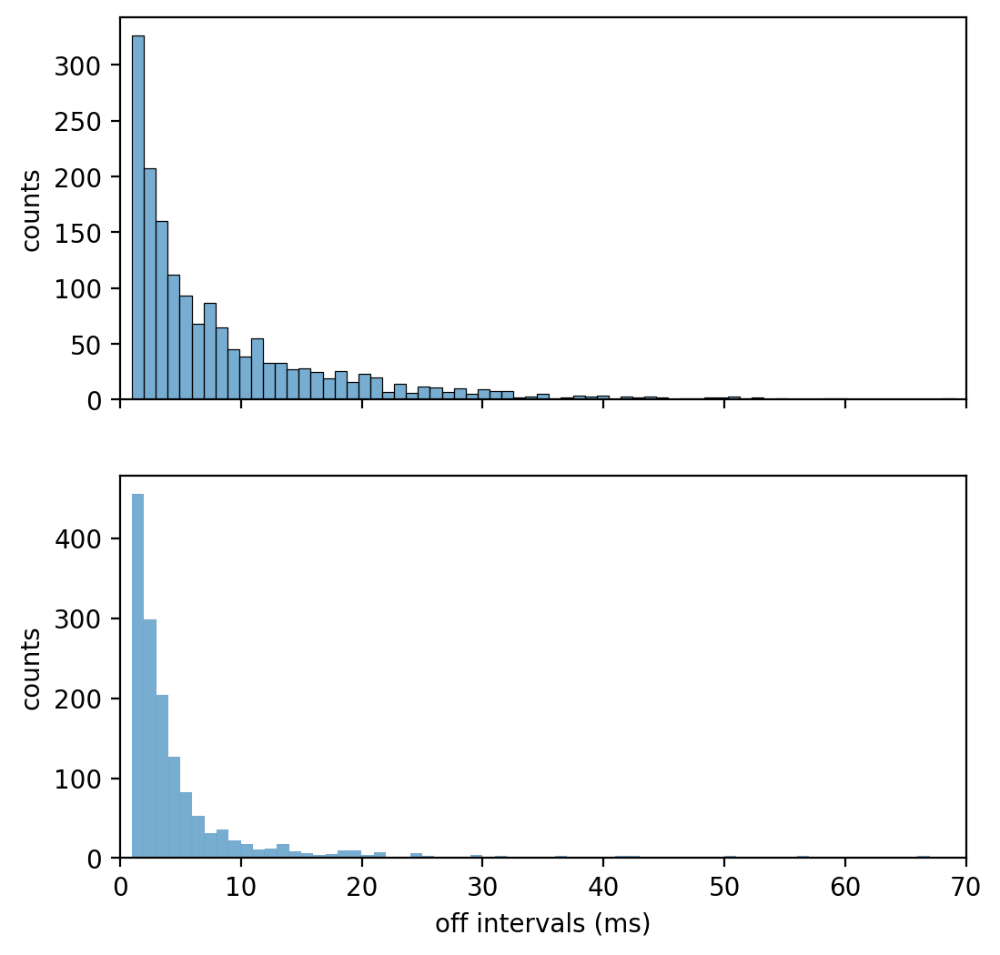

In [689]:
# Create a figure for two subplots 
fig, ax = plt.subplots(2, 1, figsize=(6,6), sharex=True)

# seaborn histplot of the on intervals
hist_on = sns.histplot(intervals_on, bins=np.max(intervals_on), ax=ax[0], alpha=0.6, log_scale=(False, False))
#ax[0].set_yscale('log')

# Set axis labels
ax[0].set_xlabel('on intervals (ms)')
ax[0].set_ylabel('counts')

# seaborn histplot of the off intervals
hist_off = sns.histplot(intervals_off, bins=np.max(intervals_off), ax=ax[1], alpha=0.6, log_scale=(False, False))
#ax[1].set_yscale('log')
#ax[1].set_xscale('log')
ax[1].set_xlim(0, 70)

# Set axis labels
ax[1].set_xlabel('off intervals (ms)')
ax[1].set_ylabel('counts')

# Get the count values from the on intervals histogram
counts_on = [p.get_height() for p in hist_on.patches]
print(len(counts_on))

# Get the count values from the off intervals histogram
counts_off = [p.get_height() for p in hist_off.patches]
print(len(counts_off))

# Create x values for the exponential functions
x_on = np.linspace(1, 67, 68)
print(len(x_on))
x_off = np.linspace(1, 68, 11400)
print(len(x_off))

def exp_func(x, a, b, c):
    return a * np.exp(-b * x) + c

popt_on, pcov_on = curve_fit(exp_func, x_on, counts_on)
popt_off, pcov_off = curve_fit(exp_func, x_off, counts_off)

# Plot the exponential functions
ax[0].plot(x, exp_func(x, *popt_on), color='red', alpha=0.6, label='fit')
ax[1].plot(x, exp_func(x, *popt_off), color='red', alpha=0.6, label='fit')

# Add a legend
ax[0].legend()
ax[1].legend()





